In [1]:
# Last amended: 13th May 2022
# Data source: Kaggle: https://www.kaggle.com/fayomi/advertising
#
# Spyder note: Use F9 in Spyder to execute a line and advance
#
# objectives:
#           Discover relationships and existence of pattern
#           in data
#              i)  Feature Engineering for categorical variables
#             ii)  Extracting datetime components
#             iii) Behaviour of 'apply' vs 'map' for Series
#              iv)  Learning to draw various types of graphs
#               v)  Conditional plots using catplot
#              vi)  Relationship plots using relplot
#             vii)  Learning seaborn plots
#            viii)  Looking at structure in data
#                       a. Parallel coordinates plots
#                       b. Radviz plots
#                       c. Andrews curves

# Good reference: https://seaborn.pydata.org/introduction.html


In [2]:
# 1.0 Call libraries
%reset -f
# 1.1 For data manipulations
import numpy as np
import pandas as pd
from numpy.random import default_rng

# 1.2 For plotting
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl     # For creating colormaps


# 1.3 For data processing
from sklearn.preprocessing import StandardScaler

# 1.4 OS related
import os

# 1.5 for working in ipython
#%matplotlib qt5
#%matplotlib inline

In [3]:
# 1.6.1 For generating random numbers:
rng = default_rng()

In [4]:
ad=pd.read_csv("C:\\Users\\arpit\\Downloads\\sample.csv")

In [5]:
ad.shape

(5000, 24)

In [6]:
# 2.1 Have a look at the data
ad.head()
print("\n-----\n")
ad.dtypes
print("\n------\n")
ad.dtypes.value_counts()


-----


------



int64      14
object      9
float64     1
dtype: int64

In [7]:
ad["hour"] = pd.to_datetime(ad["hour"])

In [8]:
def count_unique(d, columns):
    for column in columns:
        print("Number of Unique values in column {} is {}".format(column, str(len(d[column].unique()))))

In [9]:
columns = list(ad.columns)
count_unique(ad, columns)

Number of Unique values in column id is 4958
Number of Unique values in column click is 2
Number of Unique values in column hour is 6
Number of Unique values in column C1 is 6
Number of Unique values in column banner_pos is 5
Number of Unique values in column site_id is 331
Number of Unique values in column site_domain is 272
Number of Unique values in column site_category is 12
Number of Unique values in column app_id is 294
Number of Unique values in column app_domain is 33
Number of Unique values in column app_category is 13
Number of Unique values in column device_id is 830
Number of Unique values in column device_ip is 4569
Number of Unique values in column device_model is 947
Number of Unique values in column device_type is 4
Number of Unique values in column device_conn_type is 4
Number of Unique values in column C14 is 250
Number of Unique values in column C15 is 4
Number of Unique values in column C16 is 5
Number of Unique values in column C17 is 119
Number of Unique values in

In [10]:
#Data Exploration & Visualization 

In [11]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [12]:
import plotly.graph_objects as go
import plotly.express as px


In [13]:
fig = px.histogram(ad, x="click")
fig.update_layout(title="Click histogram")
fig.show()

In [14]:
ad["click"].value_counts()

0    4197
1     803
Name: click, dtype: int64

In [15]:
CTR = len(ad[ad["click"] == 1]) / len(ad)
print("Click-Through Rate (CTR): {}".format(str(CTR)))

Click-Through Rate (CTR): 0.1606


#Insight: From the above histogram and statistic, we can observe that about 4197 users do not click on our ad but only a small fraction of 803 users happen to click our ad. Our CTR is ~16%. This means that about 85% of the people do not click on the ad at all

In [16]:
# 3.0 Select only numeric columns for the purpose
num_data = ad.select_dtypes(include = ['float64', 'int64']).copy()
num_data.head()
num_data.shape       
num_data.columns

Index(['id', 'click', 'C1', 'banner_pos', 'device_type', 'device_conn_type',
       'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21'],
      dtype='object')

In [17]:
# 3.1 Columns in num_data that are either discrete (with few levels)
#     or numeric

cols=['C1','click','C14','C15','C16','C17','C18','C19','C20','C21']

In [18]:
# 3.2 Create an instance of StandardScaler object
ss= StandardScaler()

<AxesSubplot:ylabel='banner_pos'>

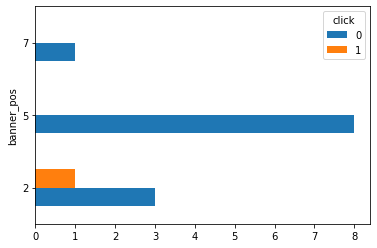

In [19]:
ad.groupby(['banner_pos','click']).size().unstack().iloc[2:,:].plot(kind='barh')

In [20]:
site_features = ['site_id', 'site_domain', 'site_category']
ad[site_features].describe()

,site_id,site_domain,site_category
count,5000,5000,5000
unique,331,272,12
top,85f751fd,c4e18dd6,50e219e0
freq,1718,1804,1855


In [21]:
# Finding Correlation,
corrMatrix=ad.corr()
corrMatrix

,id,click,C1,banner_pos,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21
id,1.000000,-0.006262,-0.005182,0.006860,-0.019862,0.004285,0.005051,-0.015111,0.009287,0.004653,0.035166,-0.008978,0.005981,-0.028525
click,-0.006262,1.000000,-0.067048,0.028679,-0.046572,-0.045219,-0.103790,-0.029026,0.107207,-0.102431,-0.058172,0.015458,-0.003541,-0.056923
C1,-0.005182,-0.067048,1.000000,0.204875,0.734651,0.147097,0.146095,0.018120,-0.004363,0.156236,0.084763,0.009643,0.030331,0.048476
banner_pos,0.006860,0.028679,0.204875,1.000000,0.268652,-0.071897,-0.002563,-0.059213,-0.057912,-0.020563,0.049182,0.212424,0.064192,-0.057070
device_type,-0.019862,-0.046572,0.734651,0.268652,1.000000,0.088011,0.114151,0.014806,0.002929,0.122830,0.029752,-0.032125,-0.058830,0.100889
device_conn_type,0.004285,-0.045219,0.147097,-0.071897,0.088011,1.000000,0.082678,0.080271,-0.019766,0.094310,0.068725,0.026203,-0.023423,0.014911
C14,0.005051,-0.103790,0.146095,-0.002563,0.114151,0.082678,1.000000,-0.014744,0.016545,0.977195,0.202189,0.171551,0.011836,0.199207
C15,-0.015111,-0.029026,0.018120,-0.059213,0.014806,0.080271,-0.014744,1.000000,-0.180784,-0.019888,-0.010075,0.063442,0.029658,0.016167
C16,0.009287,0.107207,-0.004363,-0.057912,0.002929,-0.019766,0.016545,-0.180784,1.000000,0.027511,0.072428,-0.088507,0.001947,-0.164972
C17,0.004653,-0.102431,0.156236,-0.020563,0.122830,0.094310,0.977195,-0.019888,0.027511,1.000000,0.210246,0.140549,-0.009839,0.189974


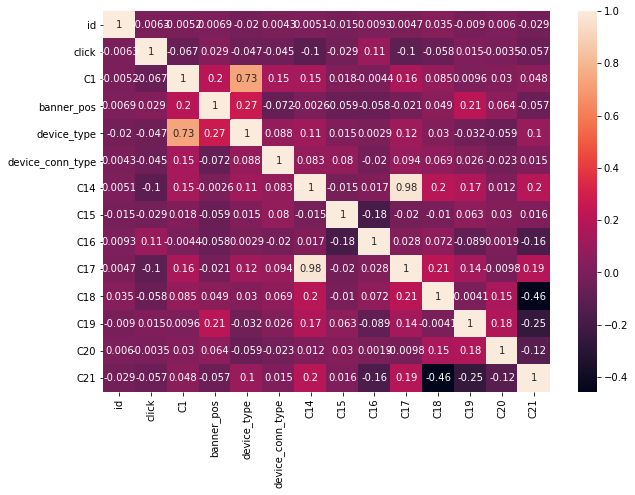

In [22]:
plt.figure(figsize=(10,7))
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [23]:
siteids = ad["site_id"].value_counts()[:5].index
site_impressions = ad["site_id"].value_counts()[:5].values
print("Top5 websites based on impressions: \n{}".format(siteids))

Top5 websites based on impressions: 
Index(['85f751fd', '1fbe01fe', 'd9750ee7', 'e151e245', '543a539e'], dtype='object')


In [24]:
top5_sites = ad[(ad["site_id"].isin(siteids))]
top5_sites_click = top5_sites.groupby(['site_id', 'click']).size().unstack().reset_index()
top5_sites_click = top5_sites_click.sort_values(by=1, ascending=False).reset_index()
top5_sites_click["site_impressions"] = site_impressions
top5_sites_click = top5_sites_click.rename(columns={0: 'Not Clicked', 1: "Clicked"})
top5_sites_click.columns.name = None
top5_sites_click = top5_sites_click.drop(["index"], axis=1)
top5_sites_click.head()

,site_id,Not Clicked,Clicked,site_impressions
0,1fbe01fe,874,260,1718
1,85f751fd,1551,167,1134
2,d9750ee7,123,74,197
3,e151e245,122,49,171
4,543a539e,85,5,90


In [25]:
fig = go.Figure(data=[
    go.Bar(name='Clicked', x=top5_sites_click["site_id"], y=top5_sites_click["Clicked"],
           hovertemplate='Site ID: %{x} <br>Clicks: %{y}', marker_color='seagreen'),
    go.Bar(name='Not Clicked', x=top5_sites_click["site_id"], y=top5_sites_click["Not Clicked"], 
           hovertemplate='Site ID: %{x} <br>Clicks: %{y}', marker_color='firebrick')])

In [26]:
fig.update_layout(
    title = 'Top5 Sites based on Clicks',
    xaxis_title = "Top5 Site IDs",
    yaxis_title = "Impressions / site",
    barmode='group')
fig.show()

Insight: Of the all sites on which our ads are placed, we have the top 5 sites in terms of amount of impressions they had. As before, a lot of people happen to see the ads but only few of them end up clicking on them. This is evident by the green bars shown above.

In [27]:
# 3.3 Use fit and transform method
nc = ss.fit_transform(num_data.loc[:,cols])

In [28]:
# 3.5 Transform numpy array back to pandas dataframe
#        as we will be using pandas plotting functions

nc = pd.DataFrame(nc, columns = cols)
nc.head(2)

,C1,click,C14,C15,C16,C17,C18,C19,C20,C21
0,-0.081689,-0.437410,-3.755550,0.078349,-0.181078,-3.575059,0.386684,-0.560849,1.084851,-0.967524
1,-0.081689,2.286187,-0.705073,0.078349,-0.181078,-0.703348,-1.085276,-0.575461,1.083568,0.263489


In [29]:
rng = np.random.default_rng()
nc_rand = pd.DataFrame(rng.normal(size = (1000,10)),
                       columns = cols    # Assign column names, just like that
                       )

# Parallel coordinates plot

In [30]:
# 5.0   Now start plotting
#        https://pandas.pydata.org/docs/reference/api/pandas.plotting.parallel_coordinates.html

In [31]:
ad.head()

,id,click,hour,C1,banner_pos,site_id,site_domain,site_category,app_id,app_domain,...,device_type,device_conn_type,C14,C15,C16,C17,C18,C19,C20,C21
0,1.586780e+19,0,1970-01-01 00:00:00.014102105,1005,1,e151e245,7e091613,f028772b,ecad2386,7801e8d9,...,1,0,4687,320,50,423,2,39,100148,32
1,7.293930e+18,1,1970-01-01 00:00:00.014102101,1005,0,1fbe01fe,f3845767,28905ebd,ecad2386,7801e8d9,...,1,0,15702,320,50,1722,0,35,100084,79
2,1.062020e+19,0,1970-01-01 00:00:00.014102105,1005,0,85f751fd,c4e18dd6,50e219e0,f0d41ff1,2347f47a,...,1,0,21666,320,50,2494,3,35,-1,112
3,5.070740e+18,0,1970-01-01 00:00:00.014102102,1005,0,85f751fd,c4e18dd6,50e219e0,39947756,2347f47a,...,1,2,21647,320,50,2487,1,547,-1,51
4,5.446950e+18,0,1970-01-01 00:00:00.014102103,1005,1,5b4d2eda,16a36ef3,f028772b,ecad2386,7801e8d9,...,1,0,19950,320,50,1800,3,167,100074,23


<Figure size 1440x1080 with 0 Axes>

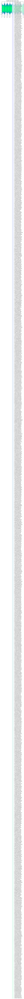

<Figure size 1440x1080 with 0 Axes>

In [32]:
# 5.1 Parallel coordinates with random data

fig1 = plt.figure()

pd.plotting.parallel_coordinates(nc_rand,
                                 'click',    # class_column
                                  colormap='winter'
                                  )
plt.xticks(rotation=90)
plt.title("Parallel chart with random data")
plt.figure(figsize=(20,15))

Text(0.5, 1.0, 'Parallel chart with ad data')

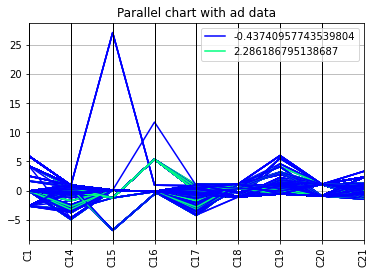

In [33]:
# 5.2 Parallel coordinates with 'ad' data
fig2 = plt.figure()
ax = pd.plotting.parallel_coordinates(nc,
                                 'click',
                                  colormap= plt.cm.winter
                                  )

plt.xticks(rotation=90)
plt.title("Parallel chart with ad data")

# Andrews plot

Text(0.5, 1.0, 'Andrews plots with random data')

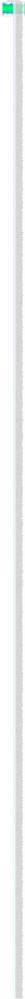

In [34]:
# 6.0 Andrews charts with random data
fig3 = plt.figure()
pd.plotting.andrews_curves(nc_rand,
                           'click',
                           colormap = 'winter')

plt.title("Andrews plots with random data")

Text(0.5, 1.0, 'Andrews curve with ad data')

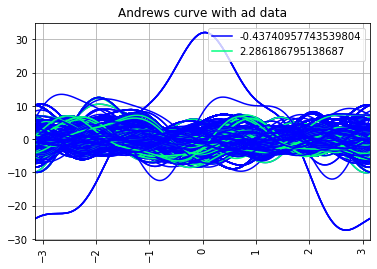

In [35]:
# 6.1 Andrews plots with ad data
fig4 = plt.figure()
pd.plotting.andrews_curves(nc,
                           'click',
                            colormap = plt.cm.winter
                           )
plt.xticks(rotation=90)
plt.title("Andrews curve with ad data")

# Radviz plot

<AxesSubplot:>

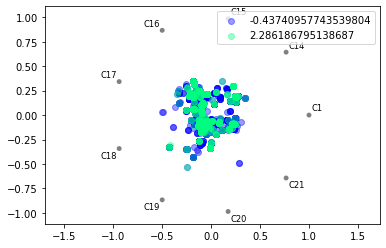

In [36]:
# 7.0 Radviz plot
# https://pandas.pydata.org/docs/reference/api/pandas.plotting.radviz.html

fig5 = plt.figure()
pd.plotting.radviz(nc,
                   class_column ='click',
                   colormap= plt.cm.winter,
                   alpha = 0.4
                   )

# t-sne

In [37]:
# 8.0 See the power of t-sne
#      (t-distributed Stochastic Neighbor Embedding)

from sklearn.manifold import TSNE

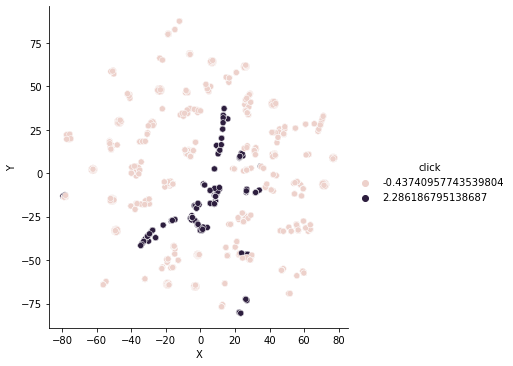

In [38]:
# 8.1 Project all data but 'Clicked_on_ad' on two axis
#        Also just replace nc with nc_rand and try again

X_embedded = TSNE(n_components=2).fit_transform(nc.iloc[:,:-1])
X_embedded.shape    # (1000,2), numpy array
df = pd.DataFrame(X_embedded, columns=['X','Y'])

# 11.5.2 No two plots will be the same
sns.relplot(x = "X",
            y = "Y",
            hue = nc.click,    # Colur each point as per 1 or 0
            data = df
            )